# Analyzing Police Activity with Pandas
Data :
- Traffic stops in Rhode Island from Stanford Open Policing Project
- Weather in Providence Rhode Island from NOAA

In [1]:
# import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
POLICE_FILE = 'data/csv/police.csv'
WEATHER_FILE = 'data/csv/weather.csv'

## Examine and Cleaning data

In [3]:
rhode_df = pd.read_csv(POLICE_FILE)
rhode_df.head()

,state,stop_date,stop_time,county_name,driver_gender,driver_race,violation_raw,violation,search_conducted,search_type,stop_outcome,is_arrested,stop_duration,drugs_related_stop,district
0,RI,2005-01-04,12:55,NaN,M,White,Equipment/Inspection Violation,Equipment,False,NaN,Citation,False,0-15 Min,False,Zone X4
1,RI,2005-01-23,23:15,NaN,M,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone K3
2,RI,2005-02-17,04:15,NaN,M,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone X4
3,RI,2005-02-20,17:15,NaN,M,White,Call for Service,Other,False,NaN,Arrest Driver,True,16-30 Min,False,Zone X1
4,RI,2005-02-24,01:20,NaN,F,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone X3


In [4]:
print(rhode_df.isnull().sum())
rhode_df.shape

state                     0
stop_date                 0
stop_time                 0
county_name           91741
driver_gender          5205
driver_race            5202
violation_raw          5202
violation              5202
search_conducted          0
search_type           88434
stop_outcome           5202
is_arrested            5202
stop_duration          5202
drugs_related_stop        0
district                  0
dtype: int64


(91741, 15)

In [5]:
# county_name column all empty and state column all represented RI so we can drop both columns
rhode_df.drop(['county_name','state'], axis=1, inplace=True)

In [6]:
rhode_df.dropna(subset=['driver_gender'], inplace=True)

In [7]:
print(rhode_df.isnull().sum())
rhode_df.shape

stop_date                 0
stop_time                 0
driver_gender             0
driver_race               0
violation_raw             0
violation                 0
search_conducted          0
search_type           83229
stop_outcome              0
is_arrested               0
stop_duration             0
drugs_related_stop        0
district                  0
dtype: int64


(86536, 13)

In [8]:
rhode_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86536 entries, 0 to 91740
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   stop_date           86536 non-null  object
 1   stop_time           86536 non-null  object
 2   driver_gender       86536 non-null  object
 3   driver_race         86536 non-null  object
 4   violation_raw       86536 non-null  object
 5   violation           86536 non-null  object
 6   search_conducted    86536 non-null  bool  
 7   search_type         3307 non-null   object
 8   stop_outcome        86536 non-null  object
 9   is_arrested         86536 non-null  object
 10  stop_duration       86536 non-null  object
 11  drugs_related_stop  86536 non-null  bool  
 12  district            86536 non-null  object
dtypes: bool(2), object(11)
memory usage: 4.5+ MB


## Fixing Data Type

In [9]:
rhode_df['is_arrested'] = rhode_df.is_arrested.astype('bool')
rhode_df['drugs_related_stop'] = rhode_df.drugs_related_stop.astype('bool')
rhode_df['stop_datetime'] = pd.to_datetime(
    rhode_df.stop_date.str.cat(rhode_df.stop_time, sep=' '))
print(rhode_df.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86536 entries, 0 to 91740
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   stop_date           86536 non-null  object        
 1   stop_time           86536 non-null  object        
 2   driver_gender       86536 non-null  object        
 3   driver_race         86536 non-null  object        
 4   violation_raw       86536 non-null  object        
 5   violation           86536 non-null  object        
 6   search_conducted    86536 non-null  bool          
 7   search_type         3307 non-null   object        
 8   stop_outcome        86536 non-null  object        
 9   is_arrested         86536 non-null  bool          
 10  stop_duration       86536 non-null  object        
 11  drugs_related_stop  86536 non-null  bool          
 12  district            86536 non-null  object        
 13  stop_datetime       86536 non-null  datetime64

In [10]:
# set index
rhode_df.set_index('stop_datetime', inplace=True)

rhode_df.columns

Index(['stop_date', 'stop_time', 'driver_gender', 'driver_race',
       'violation_raw', 'violation', 'search_conducted', 'search_type',
       'stop_outcome', 'is_arrested', 'stop_duration', 'drugs_related_stop',
       'district'],
      dtype='object')

# Explore Relationship Between Gender and Policing

In [11]:
pd.crosstab(rhode_df['driver_race'], rhode_df['driver_gender'])

driver_gender,F,M
driver_race,,
Asian,551,1838
Black,2681,9604
Hispanic,1953,7774
Other,53,212
White,18536,43334


In [12]:
print(rhode_df['stop_outcome'].value_counts(normalize=True))
print(rhode_df['violation'].value_counts(normalize=True))
print(rhode_df['driver_race'].value_counts(normalize=True))

Citation            0.890855
Warning             0.059351
Arrest Driver       0.031605
No Action           0.007211
N/D                 0.007014
Arrest Passenger    0.003964
Name: stop_outcome, dtype: float64
Speeding               0.559571
Moving violation       0.187483
Equipment              0.126202
Other                  0.050950
Registration/plates    0.042791
Seat belt              0.033004
Name: violation, dtype: float64
White       0.714963
Black       0.141964
Hispanic    0.112404
Asian       0.027607
Other       0.003062
Name: driver_race, dtype: float64


In [13]:
# Create new sub dataset for female and male
female = rhode_df[rhode_df['driver_gender'] == 'F']
male = rhode_df[rhode_df['driver_gender'] == 'M']

print(female['violation'].value_counts(normalize=True))
print(male['violation'].value_counts(normalize=True))

Speeding               0.658114
Moving violation       0.138218
Equipment              0.105199
Registration/plates    0.044418
Other                  0.029738
Seat belt              0.024312
Name: violation, dtype: float64
Speeding               0.522243
Moving violation       0.206144
Equipment              0.134158
Other                  0.058985
Registration/plates    0.042175
Seat belt              0.036296
Name: violation, dtype: float64


In [14]:
f_and_speeding = female[female['violation'] == 'Speeding']
m_and_speeding = male[male['violation'] == 'Speeding']

print(f_and_speeding['stop_outcome'].value_counts(normalize=True))
print(m_and_speeding['stop_outcome'].value_counts(normalize=True))

Citation            0.952192
Warning             0.040074
Arrest Driver       0.005752
N/D                 0.000959
Arrest Passenger    0.000639
No Action           0.000383
Name: stop_outcome, dtype: float64
Citation            0.944595
Warning             0.036184
Arrest Driver       0.015895
Arrest Passenger    0.001281
No Action           0.001068
N/D                 0.000976
Name: stop_outcome, dtype: float64


In [15]:
rhode_df.groupby(['driver_gender', 'violation']).mean()

search_conducted  is_arrested  \
driver_gender violation                                            
F             Equipment                    0.039984     0.067573   
              Moving violation             0.039257     0.065125   
              Other                        0.041018     0.114569   
              Registration/plates          0.054924     0.087121   
              Seat belt                    0.017301     0.022491   
              Speeding                     0.008309     0.006391   
M             Equipment                    0.071496     0.064133   
              Moving violation             0.061524     0.056114   
              Other                        0.046191     0.072934   
              Registration/plates          0.108802     0.093691   
              Seat belt                    0.035119     0.027217   
              Speeding                     0.027885     0.017177   

                                   drugs_related_stop  
driver_gender violation                                
F             Equipment                      0.010396  
              Moving violation               0.009434  
              Other                          0.009901  
              Registration/plates            0.004735  
              Seat belt                      0.008651  
              Speeding                       0.002109  
M             Equipment                      0.020071  
              Moving violation               0.017081  
              Other                          0.004592  
              Registration/plates            0.017756  
              Seat belt                      0.018437  
              Speeding                       0.007902

# Visual EDA

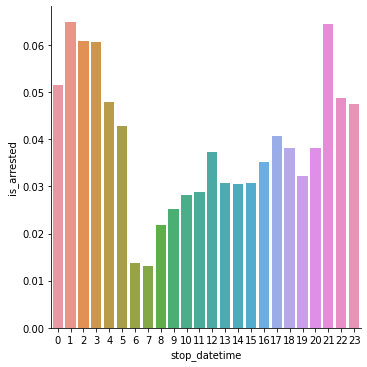

In [18]:
sns.color_palette("husl")
_ = sns.catplot(x=rhode_df.index.hour, y='is_arrested', kind='bar', data=rhode_df, ci=None)


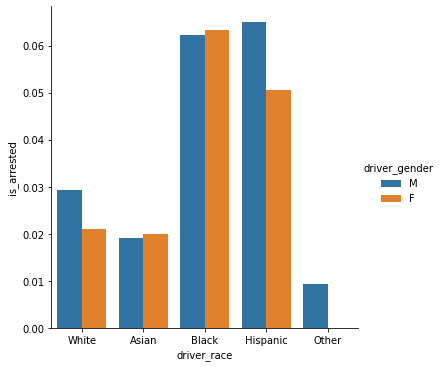

In [19]:
_ = sns.catplot(x='driver_race', y='is_arrested', kind='bar', data=rhode_df, hue='driver_gender',ci=None)

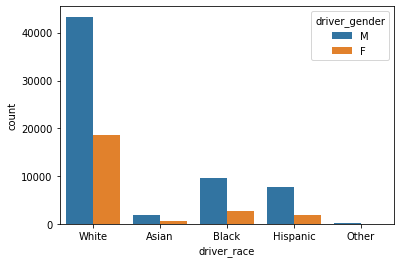

In [20]:
_ = sns.countplot(x='driver_race', data=rhode_df, hue='driver_gender')

[Text(0.5, 0, 'Hour'),
 Text(0, 0.5, 'Distribution'),
 Text(0.5, 1.0, 'Number of Traffic Police Activity by hour')]

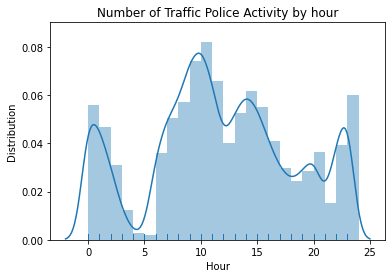

In [21]:
fig, ax = plt.subplots()
sns.distplot(rhode_df.index.hour, rug=True, bins=np.arange(25), ax=ax)
ax.set(xlabel='Hour', ylabel='Distribution', title='Number of Traffic Police Activity by hour')

# Effect of Weather to Police Activity

In [22]:
weather_df = pd.read_csv(WEATHER_FILE)
print(weather_df.shape)
weather_df.head()

(4017, 27)


,STATION,DATE,TAVG,TMIN,TMAX,AWND,WSF2,WT01,WT02,WT03,...,WT11,WT13,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22
0,USW00014765,2005-01-01,44.0,35,53,8.95,25.1,1.0,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USW00014765,2005-01-02,36.0,28,44,9.40,14.1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
2,USW00014765,2005-01-03,49.0,44,53,6.93,17.0,1.0,NaN,NaN,...,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
3,USW00014765,2005-01-04,42.0,39,45,6.93,16.1,1.0,NaN,NaN,...,NaN,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
4,USW00014765,2005-01-05,36.0,28,43,7.83,17.0,1.0,NaN,NaN,...,NaN,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN


In [23]:
temp_df = weather_df.loc[:, 'TAVG':'TMAX']
temp_df.head()

,TAVG,TMIN,TMAX
0,44.0,35,53
1,36.0,28,44
2,49.0,44,53
3,42.0,39,45
4,36.0,28,43


In [25]:
WT = weather_df.loc[:, 'WT01':'WT22']

In [26]:
weather_df['bad_conditions'] = WT.sum(axis='columns')


In [28]:
weather_df['bad_conditions'] = weather_df.bad_conditions.fillna(0).astype('int')

<AxesSubplot:ylabel='Frequency'>

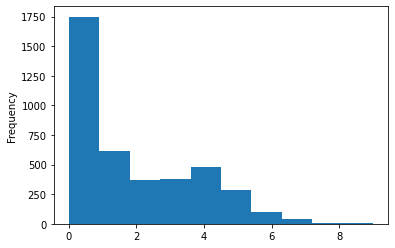

In [29]:
weather_df.bad_conditions.plot(kind='hist')

In [31]:
weather_df

,STATION,DATE,TAVG,TMIN,TMAX,AWND,WSF2,WT01,WT02,WT03,...,WT13,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,bad_conditions
0,USW00014765,2005-01-01,44.0,35,53,8.95,25.1,1.0,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
1,USW00014765,2005-01-02,36.0,28,44,9.40,14.1,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,2
2,USW00014765,2005-01-03,49.0,44,53,6.93,17.0,1.0,NaN,NaN,...,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,3
3,USW00014765,2005-01-04,42.0,39,45,6.93,16.1,1.0,NaN,NaN,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,4
4,USW00014765,2005-01-05,36.0,28,43,7.83,17.0,1.0,NaN,NaN,...,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4012,USW00014765,2015-12-27,51.0,44,61,9.17,28.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4013,USW00014765,2015-12-28,40.0,30,44,12.30,23.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4014,USW00014765,2015-12-29,33.0,28,40,12.53,18.1,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4015,USW00014765,2015-12-30,30.0,27,35,6.93,15.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


In [34]:
mapping = {0:'good', 1:'bad', 2:'bad', 3:'bad', 4:'bad', 5:'worse', 6:'worse', 7:'worse', 8:'worse', 9:'worse'}

weather_df['rating'] = weather_df.bad_conditions.map(mapping)

In [36]:
weather_df.rating.value_counts()

bad      1836
good     1749
worse     432
Name: rating, dtype: int64

In [40]:
# Create a list of weather ratings in logical order
cats = ['good', 'bad', 'worse']

# Change the data type of 'rating' to category
weather_df['rating'] = weather_df['rating'].astype('category')

In [41]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4017 entries, 0 to 4016
Data columns (total 29 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   STATION         4017 non-null   object  
 1   DATE            4017 non-null   object  
 2   TAVG            1217 non-null   float64 
 3   TMIN            4017 non-null   int64   
 4   TMAX            4017 non-null   int64   
 5   AWND            4017 non-null   float64 
 6   WSF2            4017 non-null   float64 
 7   WT01            1767 non-null   float64 
 8   WT02            221 non-null    float64 
 9   WT03            224 non-null    float64 
 10  WT04            117 non-null    float64 
 11  WT05            360 non-null    float64 
 12  WT06            25 non-null     float64 
 13  WT07            79 non-null     float64 
 14  WT08            404 non-null    float64 
 15  WT09            69 non-null     float64 
 16  WT10            2 non-null      float64 
 17  WT11          

## Merging weather_df and rhode_df

In [42]:
rhode_df.reset_index(inplace=True)
rhode_df.head()

,stop_datetime,stop_date,stop_time,driver_gender,driver_race,violation_raw,violation,search_conducted,search_type,stop_outcome,is_arrested,stop_duration,drugs_related_stop,district
0,2005-01-04 12:55:00,2005-01-04,12:55,M,White,Equipment/Inspection Violation,Equipment,False,NaN,Citation,False,0-15 Min,False,Zone X4
1,2005-01-23 23:15:00,2005-01-23,23:15,M,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone K3
2,2005-02-17 04:15:00,2005-02-17,04:15,M,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone X4
3,2005-02-20 17:15:00,2005-02-20,17:15,M,White,Call for Service,Other,False,NaN,Arrest Driver,True,16-30 Min,False,Zone X1
4,2005-02-24 01:20:00,2005-02-24,01:20,F,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone X3


In [46]:
weather_rating = weather_df[['DATE', 'rating']]
weather_rating.head()

,DATE,rating
0,2005-01-01,bad
1,2005-01-02,bad
2,2005-01-03,bad
3,2005-01-04,bad
4,2005-01-05,bad


In [47]:
police_activity = pd.merge(left=rhode_df, right=weather_rating, left_on='stop_date', right_on='DATE', how='left')

police_activity.set_index('stop_datetime', inplace=True)

In [50]:
police_activity.drop(columns='DATE', inplace=True)

In [51]:
police_activity.head()

,stop_date,stop_time,driver_gender,driver_race,violation_raw,violation,search_conducted,search_type,stop_outcome,is_arrested,stop_duration,drugs_related_stop,district,rating
stop_datetime,,,,,,,,,,,,,,
2005-01-04 12:55:00,2005-01-04,12:55,M,White,Equipment/Inspection Violation,Equipment,False,NaN,Citation,False,0-15 Min,False,Zone X4,bad
2005-01-23 23:15:00,2005-01-23,23:15,M,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone K3,worse
2005-02-17 04:15:00,2005-02-17,04:15,M,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone X4,good
2005-02-20 17:15:00,2005-02-20,17:15,M,White,Call for Service,Other,False,NaN,Arrest Driver,True,16-30 Min,False,Zone X1,bad
2005-02-24 01:20:00,2005-02-24,01:20,F,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False,Zone X3,bad


In [52]:
rhode_df.groupby(['driver_gender', 'violation']).mean()

search_conducted  is_arrested  \
driver_gender violation                                            
F             Equipment                    0.039984     0.067573   
              Moving violation             0.039257     0.065125   
              Other                        0.041018     0.114569   
              Registration/plates          0.054924     0.087121   
              Seat belt                    0.017301     0.022491   
              Speeding                     0.008309     0.006391   
M             Equipment                    0.071496     0.064133   
              Moving violation             0.061524     0.056114   
              Other                        0.046191     0.072934   
              Registration/plates          0.108802     0.093691   
              Seat belt                    0.035119     0.027217   
              Speeding                     0.027885     0.017177   

                                   drugs_related_stop  
driver_gender violation                                
F             Equipment                      0.010396  
              Moving violation               0.009434  
              Other                          0.009901  
              Registration/plates            0.004735  
              Seat belt                      0.008651  
              Speeding                       0.002109  
M             Equipment                      0.020071  
              Moving violation               0.017081  
              Other                          0.004592  
              Registration/plates            0.017756  
              Seat belt                      0.018437  
              Speeding                       0.007902

In [53]:
police_activity.groupby('rating')['is_arrested'].mean()

rating
bad      0.036261
good     0.033715
worse    0.041667
Name: is_arrested, dtype: float64

In [55]:
police_activity.groupby(['rating', 'violation']).mean()

search_conducted  is_arrested  drugs_related_stop
rating violation                                                             
bad    Equipment                    0.060983     0.066311            0.016578
       Moving violation             0.054659     0.058050            0.013020
       Other                        0.054398     0.087443            0.006101
       Registration/plates          0.090184     0.098160            0.011656
       Seat belt                    0.028116     0.022493            0.016870
       Speeding                     0.020798     0.013314            0.005877
good   Equipment                    0.061928     0.059007            0.018500
       Moving violation             0.056906     0.056227            0.017792
       Other                        0.038206     0.076966            0.005537
       Registration/plates          0.088990     0.081574            0.017114
       Seat belt                    0.033632     0.028587            0.016256
       Speeding                     0.020967     0.013405            0.006204
worse  Equipment                    0.104312     0.097357            0.022253
       Moving violation             0.069220     0.065860            0.016801
       Other                        0.037736     0.062893            0.003145
       Registration/plates          0.134375     0.115625            0.009375
       Seat belt                    0.000000     0.000000            0.000000
       Speeding                     0.028070     0.016886            0.005921